# Part 2a - Finding iris - binarization

## Setup

In [1]:
import os
import random
import re

import math
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import matplotlib.patches as patches

import cv2
from PIL import Image

## Functions

In [5]:
# Loading and preview ------------------------------------------------

def load_images_ending_with_pattern(folder_path, regex):
    images = []
    pattern = re.compile(regex)

    for root, _, files in os.walk(folder_path):
        for file in files:
            if not pattern.match(file):
                continue
            file_path = os.path.join(root, file)
            try:
                with Image.open(file_path) as img:
                    img.verify()
                image = cv2.imread(file_path, cv2.IMREAD_COLOR)
                if image is not None:
                    images.append(image)
            except Exception:
                print(f"Skipping non-image file: {file_path}")
    return images

def preview_images(images, num_previews=5):
    if not images:
        print("No images to display.")
        return

    num_previews = min(num_previews, len(images))
    selected_images = images[:num_previews]
    
    cols = min(15, num_previews)
    rows = math.ceil(num_previews / 15)
    
    plt.figure(figsize=(cols * 3, rows * 3))
    for i, img in enumerate(selected_images):
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.subplot(rows, cols, i + 1)
        plt.imshow(img_rgb)
        plt.axis('off')
    plt.tight_layout()
    plt.show()

# Resizing -----------------------------------------------------------

def resize_images(images, max_size=256):
    resized = []
    for img in images:
        h, w = img.shape[:2]
        scale = max_size / max(h, w)
        new_size = (int(w * scale), int(h * scale))  # (width, height)
        resized_img = cv2.resize(img, new_size, interpolation=cv2.INTER_AREA)
        resized.append(resized_img)
    return resized

# Correcting poor quality image --------------------------------------

def apply_clahe(gray, clip_limit=2.0, tile_grid_size=(8,8)):
    clahe = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_grid_size)
    return clahe.apply(gray)
    
def preprocess_for_pupil(gray):
    # 1) CLAHE contrast boost
    gray = apply_clahe(gray, clip_limit=2.0)
    # 2) remove small bright glints
    #    a) top‑hat subtraction
    r = max(3, int(min(gray.shape)*0.02) // 2 * 2 + 1)
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (r,r))
    tophat = cv2.morphologyEx(gray, cv2.MORPH_TOPHAT, kernel)
    gray = cv2.subtract(gray, tophat)
    # 3) median smoothing
    gray = cv2.medianBlur(gray, 5)
    # 4) optional: inpaint large residual highlights
    _, mask = cv2.threshold(gray, 240, 255, cv2.THRESH_BINARY)
    mask = cv2.dilate(mask, kernel, iterations=2)
    gray = cv2.inpaint(gray, mask, 3, cv2.INPAINT_TELEA)
    return gray

# Greyscale ----------------------------------------------------------

def convert_images_to_greyscale(images):
    grey_images = []
    for img in images:
        if len(img.shape) == 3:
            grey_img = np.mean(img, axis=2).astype(img.dtype)
        else:
            grey_img = img.copy()
        grey_images.append(grey_img)
    return grey_images

# Binarization -------------------------------------------------------

def adaptive_binarize(
    grey_images,
    initial_factor,
    white_ratio_thresh=0.9,
    min_factor=1.0,
    factor_step=0.5,
    verbose=False
):
    binaries = []
    thresholds = []

    for idx, grey in enumerate(grey_images):
        X = initial_factor
        while True:

            #------------------------------------------
            # Image sizes
            h, w = grey.shape
            # Treshold based on mean
            P = np.sum(grey) / (h * w)
            # Modified treshold
            P = P / X
            # Binarization
            bin_image = np.zeros_like(grey, dtype=np.uint8)
            bin_image[grey >= P] = 255
            #------------------------------------------

            white_ratio = np.mean(bin_image == 255)
            if white_ratio > white_ratio_thresh and (X - factor_step) >= min_factor:
                new_X = round(X - factor_step, 2)
                if verbose:
                    print(
                        f"Image {idx}: white ratio {white_ratio:.3f} > {white_ratio_thresh}, "
                        f"lowering factor {X:.2f} → {new_X:.2f} and retrying"
                    )
                X = new_X
                continue
            break

        # Print final threshold if not verbose
        if not verbose:
            print(
                f"Image {idx}: final threshold P/X = {P/X:.2f} (factor X = {X:.2f}), "
                f"white ratio = {white_ratio:.3f}"
            )

        binaries.append(bin_image)
        thresholds.append(X)

    return binaries, thresholds

# Morphologial operations --------------------------------------------

def get_structuring_element(shape, ksize, anchor=None):
    rows, cols = ksize
    if anchor is None:
        anchor = (rows // 2, cols // 2)
    if shape.lower() == "rect":
        kernel = np.ones((rows, cols), dtype=np.uint8)
    elif shape.lower() == "ellipse":
        kernel = np.zeros((rows, cols), dtype=np.uint8)
        # Use the center of the kernel for ellipse definition.
        cy, cx = rows // 2, cols // 2  
        a = rows / 2.0
        b = cols / 2.0
        for i in range(rows):
            for j in range(cols):
                # Equation of ellipse centered at (cy, cx)
                if ((i - cy) / a)**2 + ((j - cx) / b)**2 <= 1:
                    kernel[i, j] = 1
    elif shape.lower() == "cross":
        kernel = np.zeros((rows, cols), dtype=np.uint8)
        # Place ones in the row and column corresponding to anchor
        ay, ax = anchor
        if 0 <= ay < rows:
            kernel[ay, :] = 1
        if 0 <= ax < cols:
            kernel[:, ax] = 1
    else:
        raise ValueError("Unsupported kernel shape. Choose 'rect', 'ellipse', or 'cross'.")
    return kernel, anchor

def erosion(image, kernel, anchor):
    krows, kcols = kernel.shape
    ay, ax = anchor
    pad_top = ay
    pad_bottom = krows - ay - 1
    pad_left = ax
    pad_right = kcols - ax - 1
    padded = np.pad(image, ((pad_top, pad_bottom), (pad_left, pad_right)), mode='constant', constant_values=image.min())
    out = np.zeros_like(image)
    rows, cols = image.shape
    for i in range(rows):
        for j in range(cols):
            region = padded[i:i+krows, j:j+kcols]
            out[i, j] = np.max(region[kernel==1])
    return out

def dilation(image, kernel, anchor):
    krows, kcols = kernel.shape
    ay, ax = anchor
    pad_top = ay
    pad_bottom = krows - ay - 1
    pad_left = ax
    pad_right = kcols - ax - 1
    padded = np.pad(image, ((pad_top, pad_bottom), (pad_left, pad_right)), mode='constant', constant_values=image.max())
    out = np.zeros_like(image)
    rows, cols = image.shape
    for i in range(rows):
        for j in range(cols):
            region = padded[i:i+krows, j:j+kcols]
            out[i, j] = np.min(region[kernel==1])
    return out

def opening(image, kernel, anchor):
    eroded = erosion(image, kernel, anchor)
    opened = dilation(eroded, kernel, anchor)
    return opened

def closing(image, kernel, anchor):
    dilated = dilation(image, kernel, anchor)
    closed = erosion(dilated, kernel, anchor)
    return closed

# Remove artifacts away from center ----------------------------------

def mask_outside_boundary(images, x_thresh=0.9, y_thresh=0.9):
    masked = []
    for img in images:
        h, w = img.shape[:2]
        cx, cy = w/2.0, h/2.0
        dx, dy = x_thresh*(w/2.0), y_thresh*(h/2.0)
        left, right   = cx - dx, cx + dx
        top, bottom   = cy - dy, cy + dy

        # Create a boolean mask of pixels to white‑out:
        ys, xs = np.ogrid[:h, :w]
        outside = (xs < left) | (xs > right) | (ys < top) | (ys > bottom)

        out = img.copy()
        if img.ndim == 2:
            out[outside] = 255
        else:
            out[outside] = (255, 255, 255)
        masked.append(out)
    return masked

# Projections and find center ----------------------------------------

def compute_projections(image):
    h, w = image.shape
    # horizontal & vertical
    h_proj = np.sum(image == 0, axis=1)
    v_proj = np.sum(image == 0, axis=0)

    # main diagonal offsets d = j - i
    d_off = np.arange(-h+1, w)
    d_proj = np.array([
        sum(image[i, i + d] == 0
            for i in range(max(0, -d), min(h, w - d)))
        for d in d_off
    ])

    # anti-diagonal offsets s = i + j
    ad_off = np.arange(0, h + w - 1)
    ad_proj = np.array([
        sum(image[i, s - i] == 0
            for i in range(max(0, s - (w - 1)), min(h, s + 1)))
        for s in ad_off
    ])

    return h_proj, v_proj, d_proj, ad_proj, d_off, ad_off

def get_pupil_centers_from_projections(pupil_projections):
    centers = []

    for (h_proj, v_proj, d_proj, ad_proj, d_off, ad_off) in pupil_projections:
        h = h_proj.shape[0]
        w = v_proj.shape[0]

        # 1) indices of max in each projection
        h_maxs  = np.flatnonzero(h_proj  == h_proj.max())   # y‑coords
        v_maxs  = np.flatnonzero(v_proj  == v_proj.max())   # x‑coords
        d_idxs  = np.flatnonzero(d_proj  == d_proj.max())
        ad_idxs = np.flatnonzero(ad_proj == ad_proj.max())
        d_maxs  = d_off[d_idxs]    # j - i = d
        ad_maxs = ad_off[ad_idxs]  # i + j = s

        pts = []
        # H and V
        for y in h_maxs:
            for x in v_maxs:
                pts.append((x, y))

        # H and D:  j = i + d  → x = y + d
        for y in h_maxs:
            for d in d_maxs:
                pts.append((y + d, y))

        # H and A:  i + j = s → x = s - y
        for y in h_maxs:
            for s in ad_maxs:
                pts.append((s - y, y))

        # V and D:  x = x, y = x - d
        for x in v_maxs:
            for d in d_maxs:
                pts.append((x, x - d))

        # V and A:  x = x, y = s - x
        for x in v_maxs:
            for s in ad_maxs:
                pts.append((x, s - x))

        # D and A:  j = i + d  and  i + j = s
        # -> i = (s - d)/2,  j = i + d
        for d in d_maxs:
            for s in ad_maxs:
                i = (s - d) / 2.0
                j = i + d
                pts.append((j, i))

        # filter to valid image coords
        valid = [(x, y) for x, y in pts if 0 <= x < w and 0 <= y < h]
        if not valid:
            centers.append((None, None))
        else:
            xs, ys = zip(*valid)
            centers.append((float(np.mean(xs)), float(np.mean(ys))))

    return centers

# Find pupil radious -------------------------------------------------

def find_radius_from_projection_edges(projections, centers):
    radii = []

    for (h_proj, v_proj, d_proj, ad_proj, d_off, ad_off), _ in zip(projections, centers):
        # Horizontal (rows) → y direction
        h_indices = np.where(h_proj > 0)[0]
        h_radius = (h_indices[-1] - h_indices[0] + 1) / 2.0 if len(h_indices) > 0 else 0

        # Vertical (columns) → x direction
        v_indices = np.where(v_proj > 0)[0]
        v_radius = (v_indices[-1] - v_indices[0] + 1) / 2.0 if len(v_indices) > 0 else 0

        # Diagonal
        d_indices = np.where(d_proj > 0)[0]
        d_radius = (d_indices[-1] - d_indices[0] + 1) / 2.0 / math.sqrt(2) if len(d_indices) > 0 else 0

        # Anti-diagonal
        ad_indices = np.where(ad_proj > 0)[0]
        ad_radius = (ad_indices[-1] - ad_indices[0] + 1) / 2.0 / math.sqrt(2) if len(ad_indices) > 0 else 0

        radius = np.mean([v_radius, h_radius, d_radius, ad_radius])
        radii.append(radius)

    return radii

# Transfer centers to different size ---------------------------------

def map_center_to_different_image(center, target_shape, source_shape):
    src_h, src_w = source_shape
    tgt_h, tgt_w = target_shape

    x, y = center

    # Compute scaling factors regardless of direction
    scale_x = tgt_w / src_w
    scale_y = tgt_h / src_h

    # Scale and round to integer pixel location
    x_new = int(round(x * scale_x))
    y_new = int(round(y * scale_y))

    return (x_new, y_new)

def map_radius_to_different_image(radius, new_shape, base_shape):
    base_h, base_w = base_shape
    new_h, new_w = new_shape

    # Scale based on average scaling factor from both dimensions
    scale_h = new_h / base_h
    scale_w = new_w / base_w
    scale = (scale_h + scale_w) / 2.0

    return radius * scale

# Showcase -----------------------------------------------------------

def draw_pupil_boundaries(images, centers, radii, color=(0, 0, 255), thickness=2):
    n = len(images)
    cols = min(5, n)
    rows = math.ceil(n / cols)

    plt.figure(figsize=(cols*3, rows*3))
    for i, (img, (cx, cy), r) in enumerate(zip(images, centers, radii)):
        disp = img.copy()
        if disp.ndim == 2:
            disp = cv2.cvtColor(disp, cv2.COLOR_GRAY2BGR)
        cv2.circle(disp, (int(round(cx)), int(round(cy))), int(round(r)), color, thickness)

        ax = plt.subplot(rows, cols, i+1)
        ax.imshow(cv2.cvtColor(disp, cv2.COLOR_BGR2RGB))
        ax.axis('off')

    plt.tight_layout()
    plt.show()

## Load and preprocessing

In [60]:
# Loading
images = load_images_ending_with_pattern('MMU-Iris-Database', r'.*[^0-9]?1\.[a-zA-Z]+$')

# Resizing
if images[0].shape[1] > 256:
    resized_images = resize_images(images, max_size=256)
else:
    resized_images = images.copy()

# Greyscale
grey_images = convert_images_to_greyscale(resized_images)

In [61]:
from collections import Counter
def plot_threshold_histogram(thresholds):
    counts = Counter(thresholds)
    unique_vals = sorted(counts.keys())
    freqs = [counts[val] for val in unique_vals]
    if len(unique_vals) > 1:
        diffs = np.diff(unique_vals)
        width = min(diffs) * 0.8
    else:
        width = 0.1
    plt.figure(figsize=(8, 2))
    plt.bar(unique_vals, freqs, width=width, align='center', edgecolor='black')
    plt.xlabel('Final threshold factor X')
    plt.ylabel('Frequency')
    plt.title('Frequency of Each Final Threshold Factor')
    plt.tight_layout()
    plt.show()

For max white ratio: 1.0 -----------------------------------------------------------
Image 0: final threshold P/X = 0.89 (factor X = 15.00), white ratio = 1.000
Image 1: final threshold P/X = 0.90 (factor X = 15.00), white ratio = 0.998
Image 2: final threshold P/X = 0.84 (factor X = 15.00), white ratio = 1.000
Image 3: final threshold P/X = 0.85 (factor X = 15.00), white ratio = 1.000
Image 4: final threshold P/X = 0.87 (factor X = 15.00), white ratio = 1.000
Image 5: final threshold P/X = 0.86 (factor X = 15.00), white ratio = 1.000
Image 6: final threshold P/X = 0.88 (factor X = 15.00), white ratio = 1.000
Image 7: final threshold P/X = 0.87 (factor X = 15.00), white ratio = 1.000
Image 8: final threshold P/X = 0.85 (factor X = 15.00), white ratio = 1.000
Image 9: final threshold P/X = 0.85 (factor X = 15.00), white ratio = 1.000
Image 10: final threshold P/X = 0.90 (factor X = 15.00), white ratio = 1.000
Image 11: final threshold P/X = 0.90 (factor X = 15.00), white ratio = 1.000
I

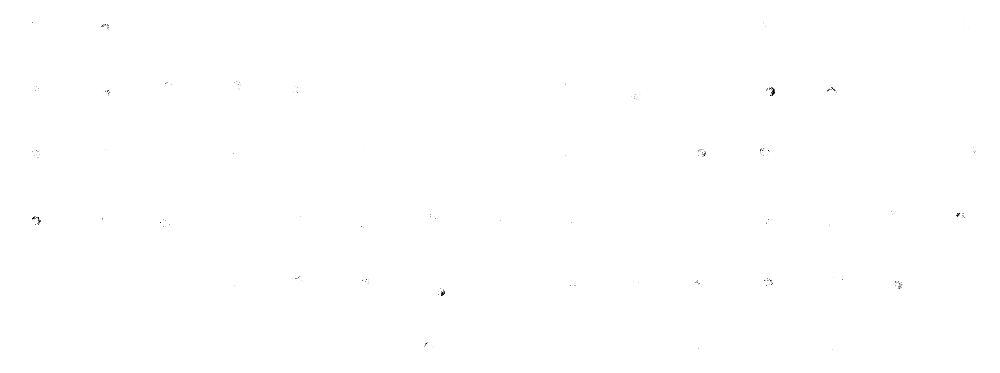

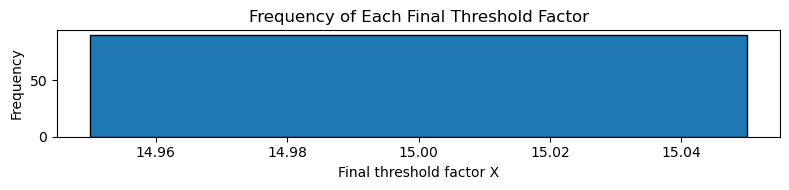



For max white ratio: 0.9 -----------------------------------------------------------
Image 0: final threshold P/X = 36.29 (factor X = 2.35), white ratio = 0.898
Image 1: final threshold P/X = 32.25 (factor X = 2.50), white ratio = 0.899
Image 2: final threshold P/X = 27.95 (factor X = 2.60), white ratio = 0.899
Image 3: final threshold P/X = 27.23 (factor X = 2.65), white ratio = 0.896
Image 4: final threshold P/X = 46.62 (factor X = 2.05), white ratio = 0.896
Image 5: final threshold P/X = 48.63 (factor X = 2.00), white ratio = 0.891
Image 6: final threshold P/X = 57.91 (factor X = 1.85), white ratio = 0.899
Image 7: final threshold P/X = 44.14 (factor X = 2.10), white ratio = 0.890
Image 8: final threshold P/X = 52.93 (factor X = 1.90), white ratio = 0.890
Image 9: final threshold P/X = 50.32 (factor X = 1.95), white ratio = 0.899
Image 10: final threshold P/X = 43.63 (factor X = 2.15), white ratio = 0.897
Image 11: final threshold P/X = 43.83 (factor X = 2.15), white ratio = 0.895

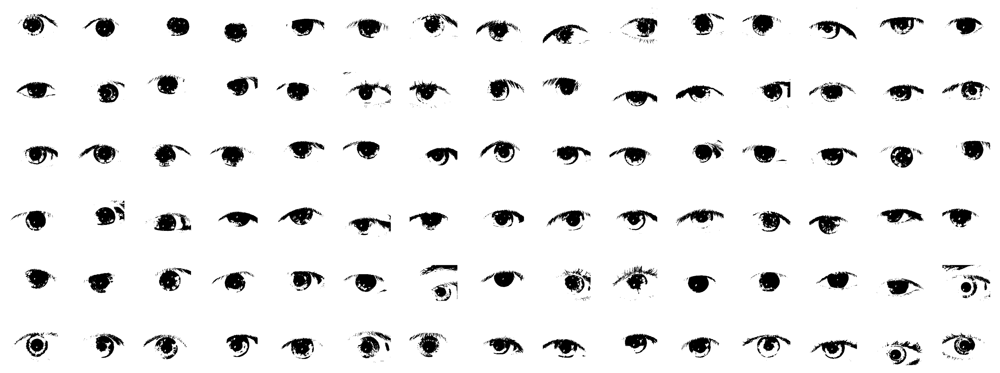

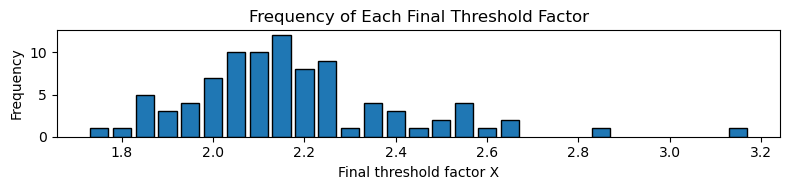



For max white ratio: 0.8 -----------------------------------------------------------
Image 0: final threshold P/X = 83.42 (factor X = 1.55), white ratio = 0.797
Image 1: final threshold P/X = 110.60 (factor X = 1.35), white ratio = 0.785
Image 2: final threshold P/X = 96.39 (factor X = 1.40), white ratio = 0.787
Image 3: final threshold P/X = 79.59 (factor X = 1.55), white ratio = 0.798
Image 4: final threshold P/X = 107.50 (factor X = 1.35), white ratio = 0.786
Image 5: final threshold P/X = 99.25 (factor X = 1.40), white ratio = 0.795
Image 6: final threshold P/X = 82.50 (factor X = 1.55), white ratio = 0.793
Image 7: final threshold P/X = 92.59 (factor X = 1.45), white ratio = 0.785
Image 8: final threshold P/X = 90.88 (factor X = 1.45), white ratio = 0.797
Image 9: final threshold P/X = 91.01 (factor X = 1.45), white ratio = 0.792
Image 10: final threshold P/X = 83.95 (factor X = 1.55), white ratio = 0.798
Image 11: final threshold P/X = 111.17 (factor X = 1.35), white ratio = 0.

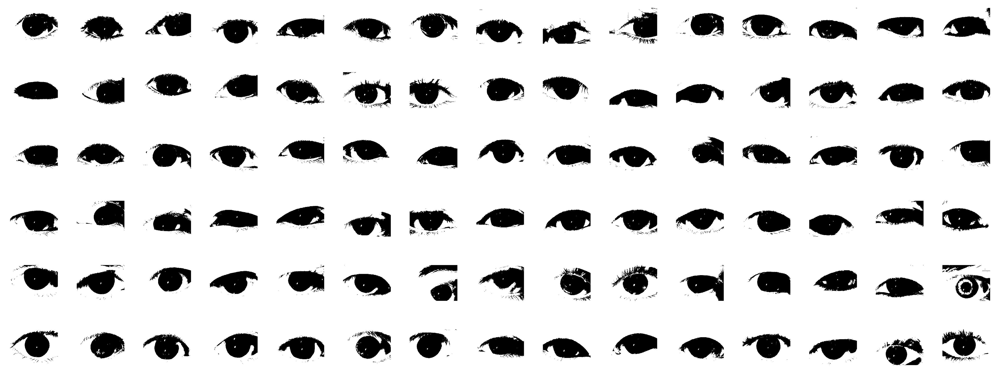

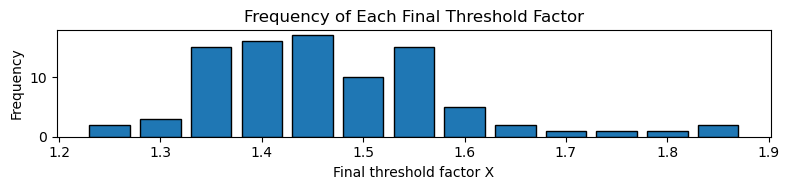



For max white ratio: 0.7 -----------------------------------------------------------
Image 0: final threshold P/X = 151.55 (factor X = 1.15), white ratio = 0.699
Image 1: final threshold P/X = 182.83 (factor X = 1.05), white ratio = 0.665
Image 2: final threshold P/X = 131.20 (factor X = 1.20), white ratio = 0.689
Image 3: final threshold P/X = 113.15 (factor X = 1.30), white ratio = 0.696
Image 4: final threshold P/X = 136.06 (factor X = 1.20), white ratio = 0.699
Image 5: final threshold P/X = 147.09 (factor X = 1.15), white ratio = 0.691
Image 6: final threshold P/X = 137.64 (factor X = 1.20), white ratio = 0.687
Image 7: final threshold P/X = 124.59 (factor X = 1.25), white ratio = 0.699
Image 8: final threshold P/X = 113.06 (factor X = 1.30), white ratio = 0.699
Image 9: final threshold P/X = 122.47 (factor X = 1.25), white ratio = 0.691
Image 10: final threshold P/X = 152.51 (factor X = 1.15), white ratio = 0.696
Image 11: final threshold P/X = 153.20 (factor X = 1.15), white r

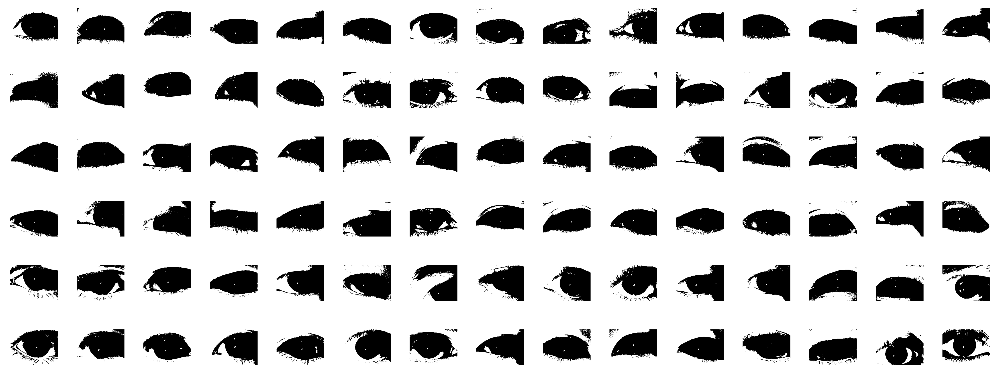

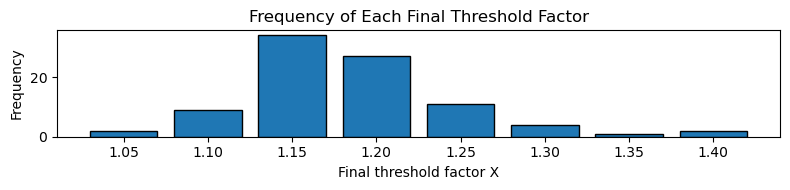



For max white ratio: 0.6 -----------------------------------------------------------
Image 0: final threshold P/X = 200.42 (factor X = 1.00), white ratio = 0.617
Image 1: final threshold P/X = 201.57 (factor X = 1.00), white ratio = 0.607
Image 2: final threshold P/X = 171.36 (factor X = 1.05), white ratio = 0.549
Image 3: final threshold P/X = 191.22 (factor X = 1.00), white ratio = 0.584
Image 4: final threshold P/X = 177.71 (factor X = 1.05), white ratio = 0.586
Image 5: final threshold P/X = 194.52 (factor X = 1.00), white ratio = 0.516
Image 6: final threshold P/X = 198.20 (factor X = 1.00), white ratio = 0.573
Image 7: final threshold P/X = 194.68 (factor X = 1.00), white ratio = 0.621
Image 8: final threshold P/X = 173.31 (factor X = 1.05), white ratio = 0.599
Image 9: final threshold P/X = 158.14 (factor X = 1.10), white ratio = 0.566
Image 10: final threshold P/X = 201.70 (factor X = 1.00), white ratio = 0.615
Image 11: final threshold P/X = 202.61 (factor X = 1.00), white r

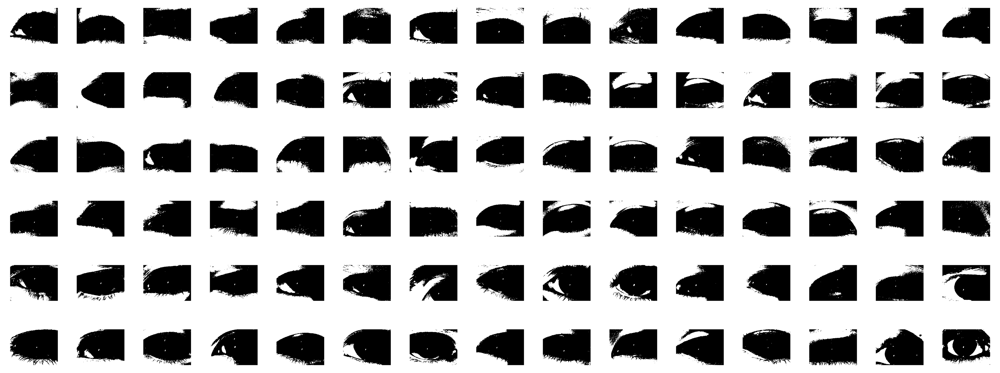

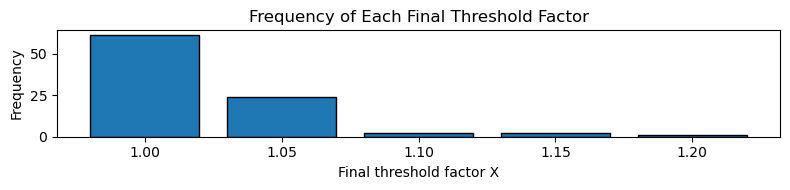

In [27]:
step = 0.1
min_ratio = 0.6
max_ratio = 1.0

for max_white_ratio in [round(max_ratio - i*step, 3) for i in range(int((max_ratio-min_ratio)/step) + 1)]:
    print('For max white ratio:', max_white_ratio, '-----------------------------------------------------------')
    pupil_bin, thresholds = adaptive_binarize(
        grey_images,
        initial_factor=15,
        white_ratio_thresh=max_white_ratio,
        min_factor=1.0,
        factor_step=0.05,
        verbose=False
    )
    print('\n')
    preview_images(pupil_bin, num_previews=len(pupil_bin))
    plot_threshold_histogram(thresholds)
    print('\n')

For max white ratio: 0.9 -----------------------------------------------------------
Image 0: final threshold P/X = 37.98 (factor X = 2.20), white ratio = 0.899
Image 1: final threshold P/X = 33.29 (factor X = 2.30), white ratio = 0.899
Image 2: final threshold P/X = 31.53 (factor X = 2.20), white ratio = 0.899
Image 3: final threshold P/X = 29.96 (factor X = 2.35), white ratio = 0.896
Image 4: final threshold P/X = 50.66 (factor X = 1.80), white ratio = 0.897
Image 5: final threshold P/X = 51.73 (factor X = 1.80), white ratio = 0.899
Image 6: final threshold P/X = 64.61 (factor X = 1.65), white ratio = 0.897
Image 7: final threshold P/X = 51.63 (factor X = 1.75), white ratio = 0.888
Image 8: final threshold P/X = 58.49 (factor X = 1.60), white ratio = 0.897
Image 9: final threshold P/X = 58.43 (factor X = 1.60), white ratio = 0.887
Image 10: final threshold P/X = 45.39 (factor X = 2.00), white ratio = 0.899
Image 11: final threshold P/X = 46.46 (factor X = 2.00), white ratio = 0.894
I

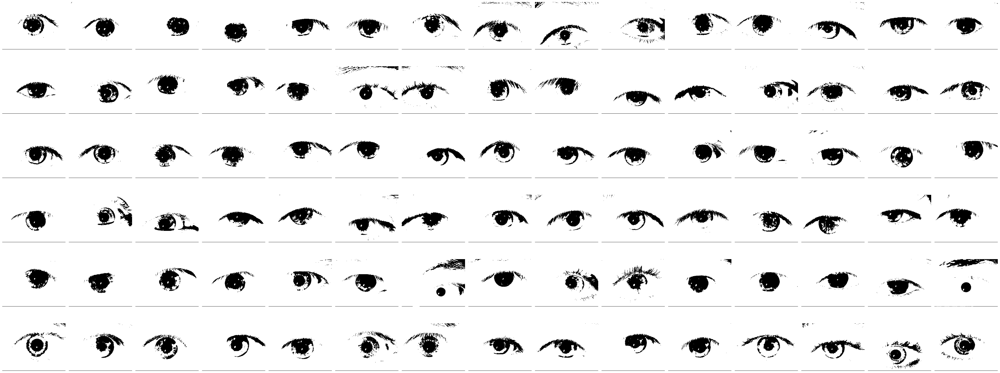

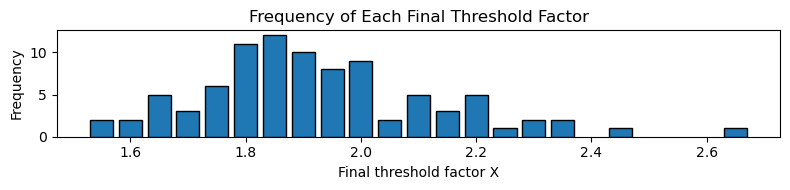



For max white ratio: 0.89 -----------------------------------------------------------
Image 0: final threshold P/X = 41.68 (factor X = 2.10), white ratio = 0.886
Image 1: final threshold P/X = 41.90 (factor X = 2.05), white ratio = 0.889
Image 2: final threshold P/X = 38.16 (factor X = 2.00), white ratio = 0.887
Image 3: final threshold P/X = 32.68 (factor X = 2.25), white ratio = 0.889
Image 4: final threshold P/X = 56.79 (factor X = 1.70), white ratio = 0.882
Image 5: final threshold P/X = 57.99 (factor X = 1.70), white ratio = 0.883
Image 6: final threshold P/X = 68.71 (factor X = 1.60), white ratio = 0.879
Image 7: final threshold P/X = 51.63 (factor X = 1.75), white ratio = 0.888
Image 8: final threshold P/X = 62.32 (factor X = 1.55), white ratio = 0.884
Image 9: final threshold P/X = 58.43 (factor X = 1.60), white ratio = 0.887
Image 10: final threshold P/X = 47.75 (factor X = 1.95), white ratio = 0.888
Image 11: final threshold P/X = 48.87 (factor X = 1.95), white ratio = 0.88

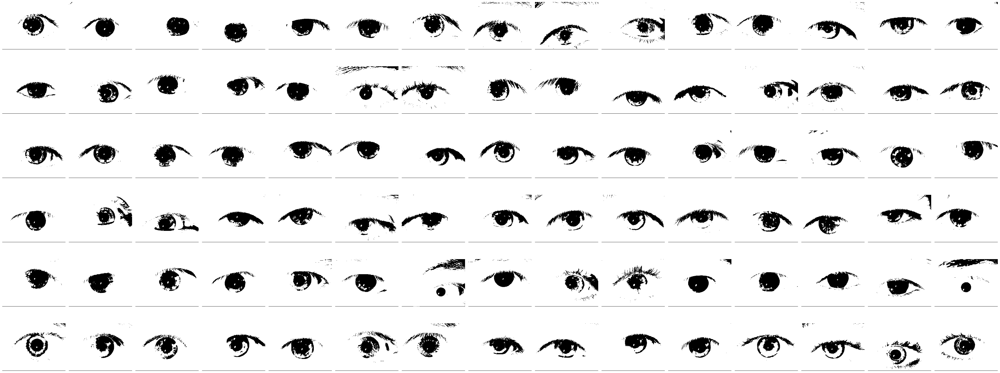

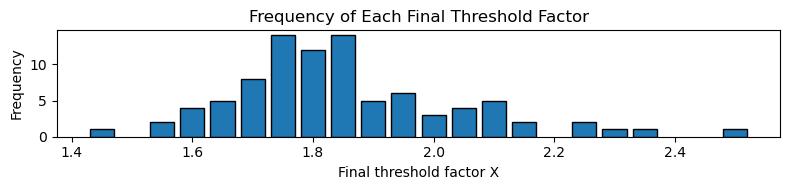



For max white ratio: 0.88 -----------------------------------------------------------
Image 0: final threshold P/X = 43.74 (factor X = 2.05), white ratio = 0.880
Image 1: final threshold P/X = 54.35 (factor X = 1.80), white ratio = 0.879
Image 2: final threshold P/X = 44.60 (factor X = 1.85), white ratio = 0.879
Image 3: final threshold P/X = 37.52 (factor X = 2.10), white ratio = 0.879
Image 4: final threshold P/X = 60.29 (factor X = 1.65), white ratio = 0.873
Image 5: final threshold P/X = 61.56 (factor X = 1.65), white ratio = 0.876
Image 6: final threshold P/X = 68.71 (factor X = 1.60), white ratio = 0.879
Image 7: final threshold P/X = 54.71 (factor X = 1.70), white ratio = 0.869
Image 8: final threshold P/X = 66.54 (factor X = 1.50), white ratio = 0.867
Image 9: final threshold P/X = 62.26 (factor X = 1.55), white ratio = 0.870
Image 10: final threshold P/X = 53.05 (factor X = 1.85), white ratio = 0.873
Image 11: final threshold P/X = 51.48 (factor X = 1.90), white ratio = 0.87

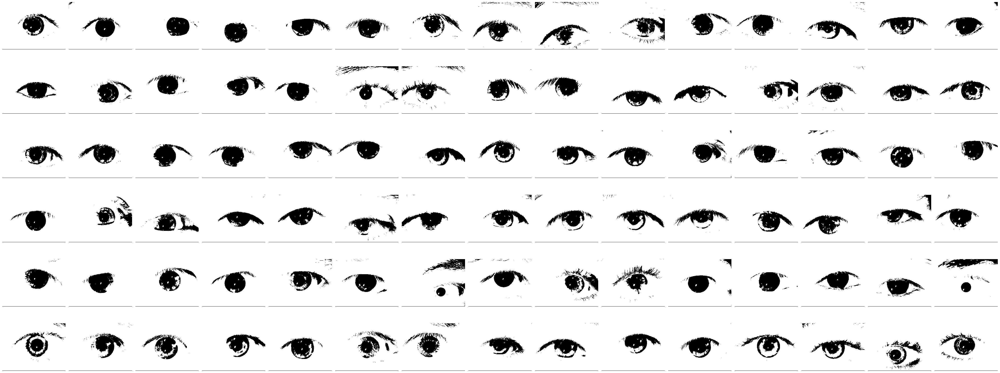

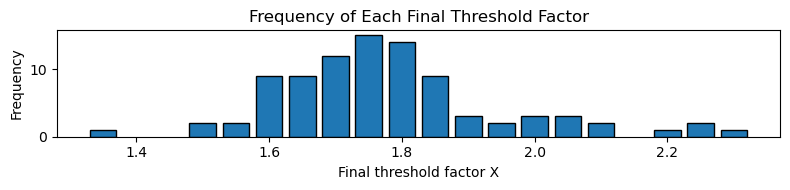



For max white ratio: 0.87 -----------------------------------------------------------
Image 0: final threshold P/X = 48.34 (factor X = 1.95), white ratio = 0.866
Image 1: final threshold P/X = 68.78 (factor X = 1.60), white ratio = 0.867
Image 2: final threshold P/X = 52.81 (factor X = 1.70), white ratio = 0.868
Image 3: final threshold P/X = 45.83 (factor X = 1.90), white ratio = 0.869
Image 4: final threshold P/X = 64.11 (factor X = 1.60), white ratio = 0.867
Image 5: final threshold P/X = 65.47 (factor X = 1.60), white ratio = 0.870
Image 6: final threshold P/X = 73.22 (factor X = 1.55), white ratio = 0.858
Image 7: final threshold P/X = 54.71 (factor X = 1.70), white ratio = 0.869
Image 8: final threshold P/X = 66.54 (factor X = 1.50), white ratio = 0.867
Image 9: final threshold P/X = 62.26 (factor X = 1.55), white ratio = 0.870
Image 10: final threshold P/X = 56.04 (factor X = 1.80), white ratio = 0.868
Image 11: final threshold P/X = 57.35 (factor X = 1.80), white ratio = 0.86

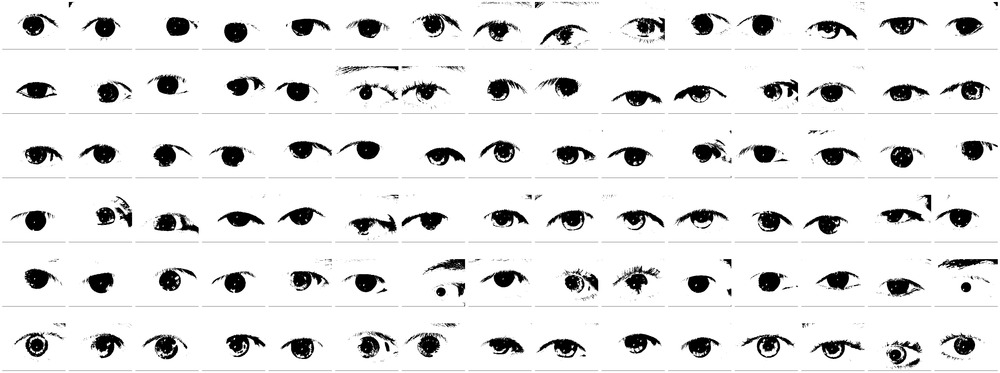

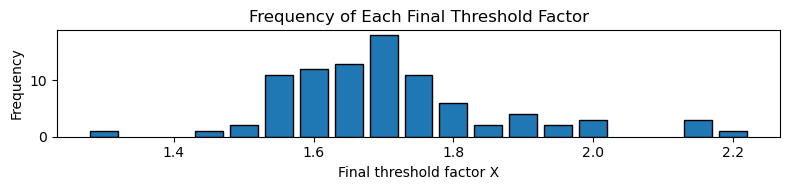



For max white ratio: 0.86 -----------------------------------------------------------
Image 0: final threshold P/X = 53.71 (factor X = 1.85), white ratio = 0.857
Image 1: final threshold P/X = 78.26 (factor X = 1.50), white ratio = 0.860
Image 2: final threshold P/X = 59.62 (factor X = 1.60), white ratio = 0.858
Image 3: final threshold P/X = 57.25 (factor X = 1.70), white ratio = 0.858
Image 4: final threshold P/X = 72.95 (factor X = 1.50), white ratio = 0.853
Image 5: final threshold P/X = 74.49 (factor X = 1.50), white ratio = 0.858
Image 6: final threshold P/X = 73.22 (factor X = 1.55), white ratio = 0.858
Image 7: final threshold P/X = 58.08 (factor X = 1.65), white ratio = 0.858
Image 8: final threshold P/X = 71.21 (factor X = 1.45), white ratio = 0.845
Image 9: final threshold P/X = 66.48 (factor X = 1.50), white ratio = 0.853
Image 10: final threshold P/X = 62.83 (factor X = 1.70), white ratio = 0.854
Image 11: final threshold P/X = 64.30 (factor X = 1.70), white ratio = 0.85

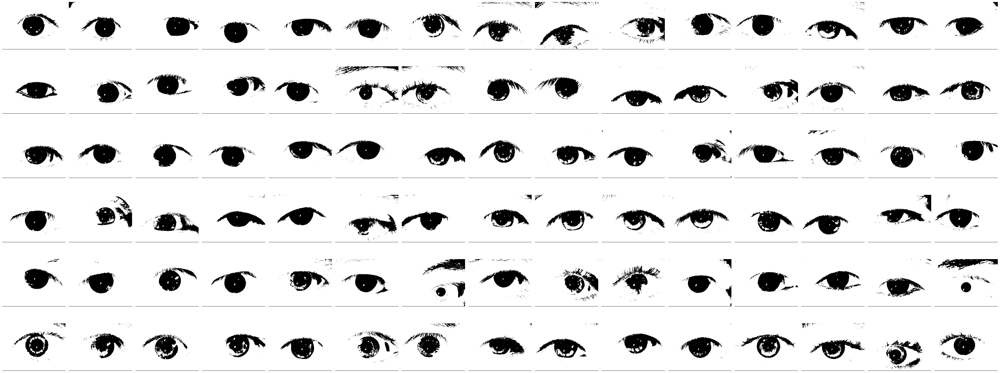

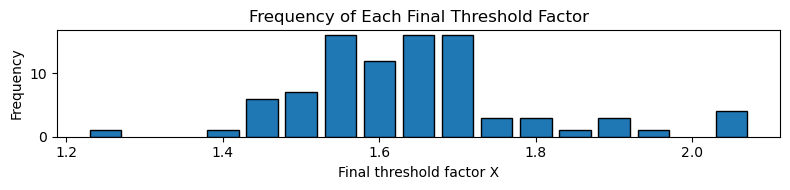



For max white ratio: 0.85 -----------------------------------------------------------
Image 0: final threshold P/X = 60.02 (factor X = 1.75), white ratio = 0.847
Image 1: final threshold P/X = 89.84 (factor X = 1.40), white ratio = 0.846
Image 2: final threshold P/X = 67.83 (factor X = 1.50), white ratio = 0.844
Image 3: final threshold P/X = 64.63 (factor X = 1.60), white ratio = 0.849
Image 4: final threshold P/X = 78.06 (factor X = 1.45), white ratio = 0.845
Image 5: final threshold P/X = 85.51 (factor X = 1.40), white ratio = 0.846
Image 6: final threshold P/X = 78.18 (factor X = 1.50), white ratio = 0.841
Image 7: final threshold P/X = 61.77 (factor X = 1.60), white ratio = 0.843
Image 8: final threshold P/X = 71.21 (factor X = 1.45), white ratio = 0.845
Image 9: final threshold P/X = 71.15 (factor X = 1.45), white ratio = 0.830
Image 10: final threshold P/X = 66.70 (factor X = 1.65), white ratio = 0.840
Image 11: final threshold P/X = 77.35 (factor X = 1.55), white ratio = 0.85

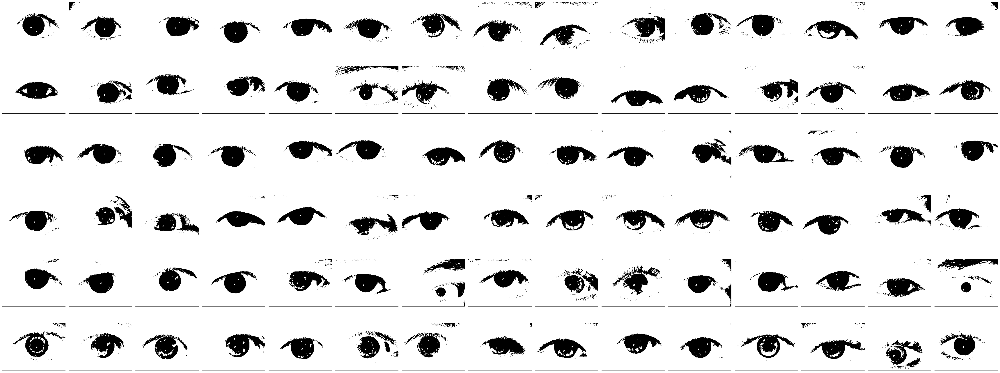

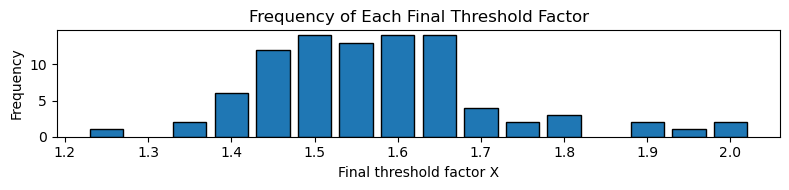



For max white ratio: 0.84 -----------------------------------------------------------
Image 0: final threshold P/X = 67.52 (factor X = 1.65), white ratio = 0.837
Image 1: final threshold P/X = 96.62 (factor X = 1.35), white ratio = 0.832
Image 2: final threshold P/X = 72.59 (factor X = 1.45), white ratio = 0.833
Image 3: final threshold P/X = 73.54 (factor X = 1.50), white ratio = 0.837
Image 4: final threshold P/X = 83.74 (factor X = 1.40), white ratio = 0.836
Image 5: final threshold P/X = 91.96 (factor X = 1.35), white ratio = 0.835
Image 6: final threshold P/X = 83.66 (factor X = 1.45), white ratio = 0.816
Image 7: final threshold P/X = 65.82 (factor X = 1.55), white ratio = 0.831
Image 8: final threshold P/X = 76.39 (factor X = 1.40), white ratio = 0.831
Image 9: final threshold P/X = 71.15 (factor X = 1.45), white ratio = 0.830
Image 10: final threshold P/X = 66.70 (factor X = 1.65), white ratio = 0.840
Image 11: final threshold P/X = 94.81 (factor X = 1.40), white ratio = 0.83

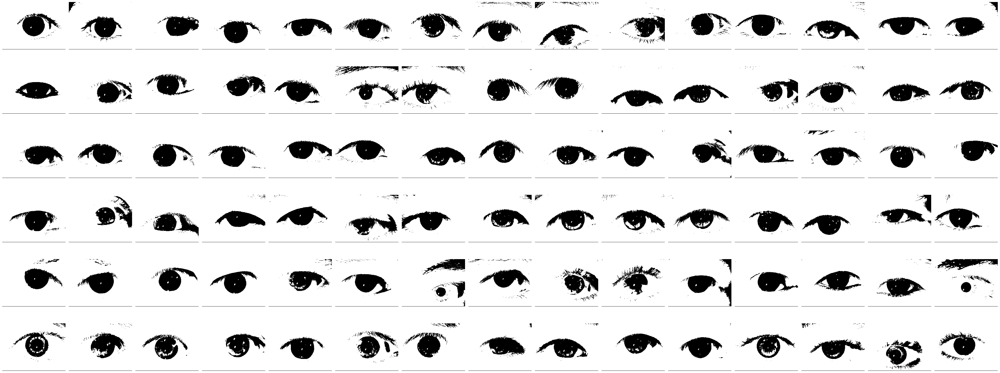

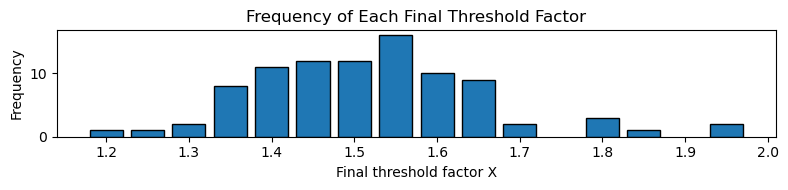



For max white ratio: 0.83 -----------------------------------------------------------
Image 0: final threshold P/X = 76.51 (factor X = 1.55), white ratio = 0.821
Image 1: final threshold P/X = 104.19 (factor X = 1.30), white ratio = 0.815
Image 2: final threshold P/X = 77.87 (factor X = 1.40), white ratio = 0.822
Image 3: final threshold P/X = 78.70 (factor X = 1.45), white ratio = 0.826
Image 4: final threshold P/X = 90.06 (factor X = 1.35), white ratio = 0.826
Image 5: final threshold P/X = 99.17 (factor X = 1.30), white ratio = 0.825
Image 6: final threshold P/X = 83.66 (factor X = 1.45), white ratio = 0.816
Image 7: final threshold P/X = 70.28 (factor X = 1.50), white ratio = 0.823
Image 8: final threshold P/X = 82.15 (factor X = 1.35), white ratio = 0.815
Image 9: final threshold P/X = 71.15 (factor X = 1.45), white ratio = 0.830
Image 10: final threshold P/X = 75.58 (factor X = 1.55), white ratio = 0.821
Image 11: final threshold P/X = 101.96 (factor X = 1.35), white ratio = 0.

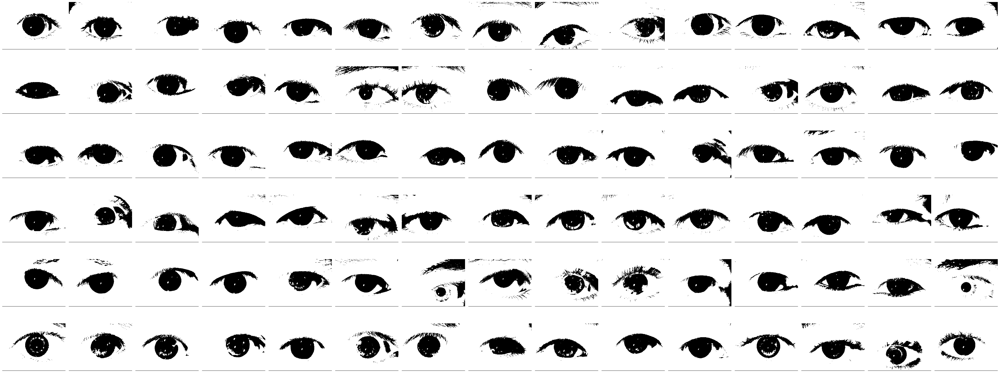

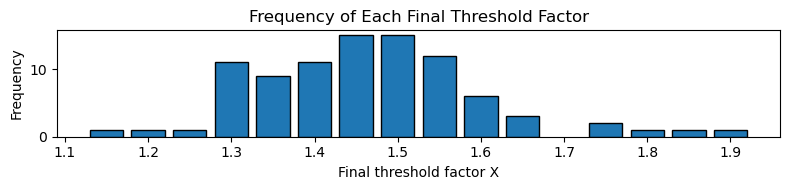



For max white ratio: 0.82 -----------------------------------------------------------
Image 0: final threshold P/X = 81.70 (factor X = 1.50), white ratio = 0.810
Image 1: final threshold P/X = 104.19 (factor X = 1.30), white ratio = 0.815
Image 2: final threshold P/X = 83.75 (factor X = 1.35), white ratio = 0.812
Image 3: final threshold P/X = 84.42 (factor X = 1.40), white ratio = 0.811
Image 4: final threshold P/X = 97.12 (factor X = 1.30), white ratio = 0.812
Image 5: final threshold P/X = 107.26 (factor X = 1.25), white ratio = 0.805
Image 6: final threshold P/X = 83.66 (factor X = 1.45), white ratio = 0.816
Image 7: final threshold P/X = 75.21 (factor X = 1.45), white ratio = 0.813
Image 8: final threshold P/X = 82.15 (factor X = 1.35), white ratio = 0.815
Image 9: final threshold P/X = 76.32 (factor X = 1.40), white ratio = 0.812
Image 10: final threshold P/X = 80.70 (factor X = 1.50), white ratio = 0.811
Image 11: final threshold P/X = 109.96 (factor X = 1.30), white ratio = 0

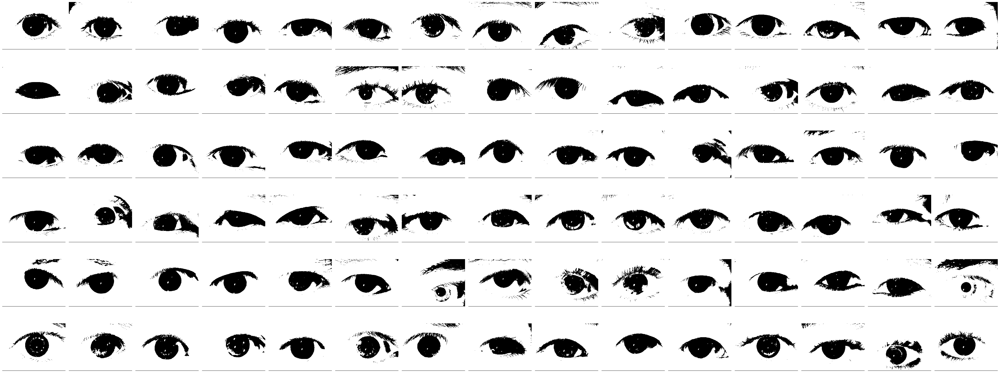

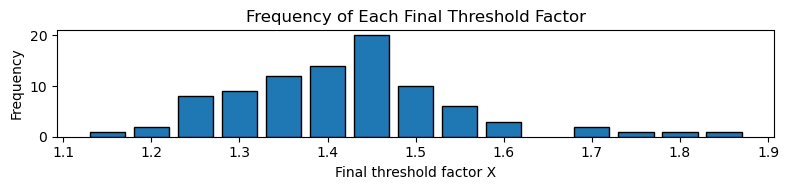



For max white ratio: 0.81 -----------------------------------------------------------
Image 0: final threshold P/X = 81.70 (factor X = 1.50), white ratio = 0.810
Image 1: final threshold P/X = 112.69 (factor X = 1.25), white ratio = 0.795
Image 2: final threshold P/X = 90.31 (factor X = 1.30), white ratio = 0.803
Image 3: final threshold P/X = 90.79 (factor X = 1.35), white ratio = 0.793
Image 4: final threshold P/X = 105.04 (factor X = 1.25), white ratio = 0.787
Image 5: final threshold P/X = 107.26 (factor X = 1.25), white ratio = 0.805
Image 6: final threshold P/X = 89.75 (factor X = 1.40), white ratio = 0.793
Image 7: final threshold P/X = 80.67 (factor X = 1.40), white ratio = 0.806
Image 8: final threshold P/X = 88.59 (factor X = 1.30), white ratio = 0.800
Image 9: final threshold P/X = 82.08 (factor X = 1.35), white ratio = 0.791
Image 10: final threshold P/X = 86.36 (factor X = 1.45), white ratio = 0.794
Image 11: final threshold P/X = 118.93 (factor X = 1.25), white ratio = 

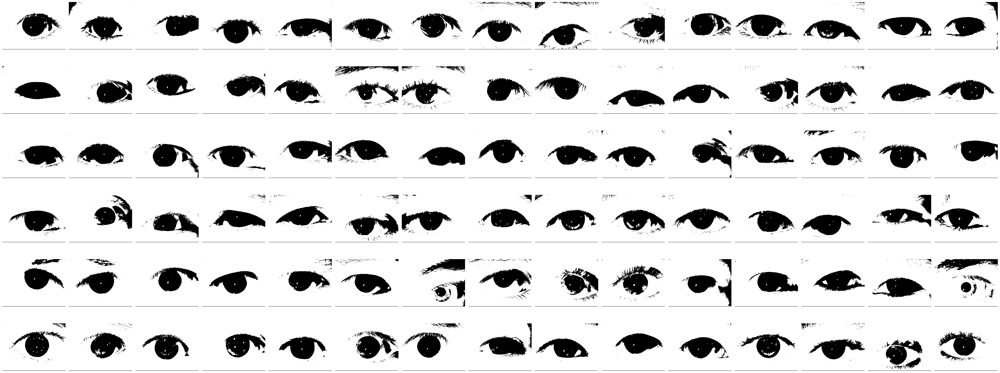

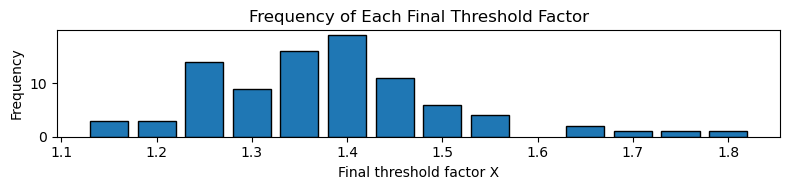

In [62]:
step = 0.01
min_ratio = 0.8
max_ratio = 0.9

for max_white_ratio in [round(max_ratio - i*step, 3) for i in range(int((max_ratio-min_ratio)/step) + 1)]:
    print('For max white ratio:', max_white_ratio, '-----------------------------------------------------------')
    pupil_bin, thresholds = adaptive_binarize(
        grey_images,
        initial_factor=15,
        white_ratio_thresh=max_white_ratio,
        min_factor=1.0,
        factor_step=0.05,
        verbose=False
    )
    print('\n')
    preview_images(pupil_bin, num_previews=len(pupil_bin))
    plot_threshold_histogram(thresholds)
    print('\n')

## Result

Image 0: final threshold P/X = 10.18 (factor X = 4.25), white ratio = 0.975
Image 1: final threshold P/X = 10.74 (factor X = 4.05), white ratio = 0.975
Image 2: final threshold P/X = 4.10 (factor X = 6.10), white ratio = 0.975
Image 3: final threshold P/X = 4.10 (factor X = 6.35), white ratio = 0.972
Image 4: final threshold P/X = 13.79 (factor X = 3.45), white ratio = 0.975
Image 5: final threshold P/X = 12.24 (factor X = 3.70), white ratio = 0.974
Image 6: final threshold P/X = 8.69 (factor X = 4.50), white ratio = 0.975
Image 7: final threshold P/X = 7.81 (factor X = 4.50), white ratio = 0.975
Image 8: final threshold P/X = 10.94 (factor X = 3.70), white ratio = 0.974
Image 9: final threshold P/X = 9.84 (factor X = 3.90), white ratio = 0.974
Image 10: final threshold P/X = 10.29 (factor X = 4.20), white ratio = 0.975
Image 11: final threshold P/X = 13.21 (factor X = 3.75), white ratio = 0.975
Image 12: final threshold P/X = 16.82 (factor X = 3.05), white ratio = 0.975
Image 13: fina

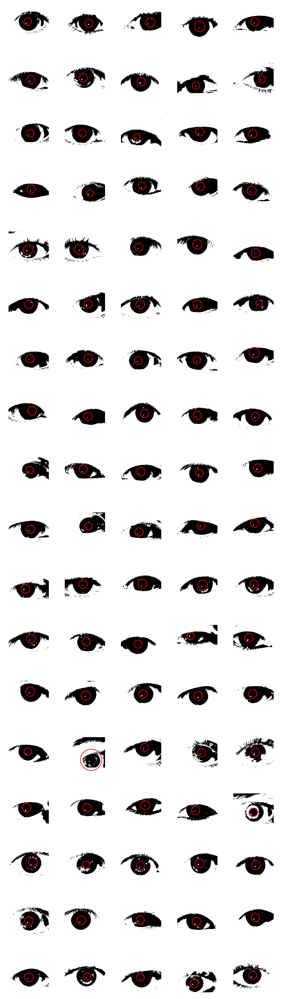

In [77]:
# Loading
images = load_images_ending_with_pattern('MMU-Iris-Database', r'.*[^0-9]?1\.[a-zA-Z]+$')

# Resizing
if images[0].shape[1] > 256:
    resized_images = resize_images(images, max_size=256)
else:
    resized_images = images.copy()

# Greyscale
grey_images = convert_images_to_greyscale(resized_images)

# For pupil ------------------------------------------------

# Binarization
binarized_pupil_images, _ = adaptive_binarize(
        grey_images,
        initial_factor=15,
        white_ratio_thresh=0.975,
        min_factor=1.0,
        factor_step=0.05,
        verbose=False
)

# Closing
kernel_size = math.floor(np.mean(binarized_pupil_images[0].shape) * (5.5/100))
structuring_element, anchor = get_structuring_element(shape="ellipse", ksize=(kernel_size, kernel_size), anchor=None)
closed_pupil_images = [closing(img, structuring_element, anchor) for img in binarized_pupil_images]

# Opening
kernel_size = math.floor(np.mean(binarized_pupil_images[0].shape) * (8/100))
structuring_element, anchor = get_structuring_element(shape="ellipse", ksize=(kernel_size, kernel_size), anchor=None)
opened_pupil_images = [opening(img, structuring_element, anchor) for img in closed_pupil_images]

# Removing artifacts near border
cleaned_pupil_images = mask_outside_boundary(opened_pupil_images, x_thresh=0.75, y_thresh=0.75)

# Calculating projections, finding pupil centers and radii for pupil
pupil_projections = [compute_projections(img) for img in cleaned_pupil_images]
pupil_centers = get_pupil_centers_from_projections(pupil_projections)
pupil_radii = find_radius_from_projection_edges(pupil_projections, pupil_centers)

# For iris -------------------------------------------------

# Removing artifacts near border
cleaned_iris_images = mask_outside_boundary(grey_images, x_thresh=0.75, y_thresh=0.75)

# Binarization
binarized_iris_images, _ = adaptive_binarize(
        cleaned_iris_images,
        initial_factor=15,
        white_ratio_thresh=0.83,
        min_factor=1.0,
        factor_step=0.05,
        verbose=False
)

# Showcase -------------------------------------------------
# Finding new pupil centers and showcasing results
new_pupil_radii = [
    map_radius_to_different_image(radius, img_to_transfer_to.shape[:2], base_img.shape[:2]) 
    for radius, img_to_transfer_to, base_img 
    in zip(pupil_radii, binarized_iris_images, cleaned_pupil_images)
]
new_pupil_centers = [
    map_center_to_different_image(center, img_to_transfer_to.shape[:2], base_img.shape[:2]) 
    for center, img_to_transfer_to, base_img
    in zip(pupil_centers, binarized_iris_images, cleaned_pupil_images)]

draw_pupil_boundaries(binarized_iris_images, new_pupil_centers, new_pupil_radii)

## Conclusion
Using binarization to detect iris works badly. The rason is that sometimes the iris is much brighter than other elements such as eyelid and sometimes it is much darker. When finding pupil we were always looking for the black circle, but now we want to find a circle that can have a variety of colors.

Instead of trying binarization and morphological operations I will draw circles of varied radious starting from the pupil (and iris) center. By increasing the radious I will measure the brightness on the circle's path and if it increases rapidly I will decuct that this is the border of an iris.